In [1]:
import pandas as pd
import numpy as np
import pickle 
import seaborn as sns
from matplotlib import rcParams
rcParams['figure.figsize'] = (6,6)

# Population genetics simulation

## Code 
```
recomb_map = msprime.RecombinationMap.read_hapmap('./Simu3/genetic_map_GRCh37_chr22.txt')
ts = msprime.simulate(
    population_configurations = [
        msprime.PopulationConfiguration(sample_size=10000, growth_rate=0, initial_size=100000)
    ],
    demographic_events = [
        msprime.PopulationParametersChange(time=200, growth_rate=0.05)
    ],
    random_seed = 101,recombination_map=recomb_map, mutation_rate=2e-8
)
```

## Input Summary 

* Instead of fixed recombination rate, in this simulation, hapmap chromosome 22 recombination map is used 
* Sample size = 10,000
* Initial population has a fixed growth rate but last 200 generation exponential growth with rate = 0.05
* Mutation rate = $2\times 10^{-8}$
* Output is about 50 Mbp size 
  

In [40]:
ts = pickle.load(open('./data/simulation3.ts','rb'))
geno = ts.genotype_matrix()
maf = np.mean(geno, axis = 1)/2

## Output Summary

* Genome size $\approx$ 50 Mb
* Number of SNPs : 829,954
* Among the SNPs 827,702 has allele frequency $<$ 0.005

## Correlation within and between 1K region

In [18]:
geno_start_mut = geno[1:1000, :].sum(axis = 0)
geno_end_mut = geno[(geno.shape[0] - 1000):(geno.shape[0]+1), :].sum(axis = 0)

np.corrcoef(geno_start_mut, geno_end_mut)

array([[ 1.00000000e+00, -7.79879959e-04],
       [-7.79879959e-04,  1.00000000e+00]])

In [19]:
geno_2ndK = geno[1000:2001, :]
geno_2ndK_mut = geno_2ndK.sum(axis = 0)
np.corrcoef(geno_start_mut, geno_2ndK_mut)

array([[1.        , 0.03597041],
       [0.03597041, 1.        ]])

We took a region in the begining of the genome of size 1,000 bp and another at the end of the genome. The correlation of mutational burden in these two regions are neglagible. Two adjacent regions of size 1K each in the begining of the genome has negligible positive correlation. 

## Correlations within and between 10K region

In [45]:
geno_1st10K = geno[0:10000,:]
geno_1st10K_mut = geno_1st10K.sum(axis = 0)

geno_2nd10K_mut = geno[10000:20001,:].sum(axis = 0)
geno_last10K_mut = geno[(geno.shape[0] - 10000):(geno.shape[0]+1),:].sum(axis = 0)

np.corrcoef(geno_1st10K_mut, geno_2nd10K_mut)


array([[1.00000000e+00, 9.31125926e-04],
       [9.31125926e-04, 1.00000000e+00]])

In [46]:
np.corrcoef(geno_1st10K_mut, geno_last10K_mut)

array([[1.00000000e+00, 9.31125926e-04],
       [9.31125926e-04, 1.00000000e+00]])

We see similar begavior when we took a 10kb region. There are negliginle or no correlation of mutational load between the regions. So far we included both the common and rare variants in the calculation. We wanted to see if the mutational burden shows any pattern when we only include the rare variants. 

In [48]:
geno_rare = geno[maf<0.005, :]

geno_rare_start_1k_mut = geno_rare[0:1000, :].sum(axis = 0)
geno_rare_end_1k_mut = geno_rare[(geno_rare.shape[0] - 1000):(geno_rare.shape[0]+1), :].sum(axis = 0)
np.corrcoef(geno_rare_start_1k_mut, geno_rare_end_1k_mut)

array([[ 1.        , -0.00423653],
       [-0.00423653,  1.        ]])

In [50]:
geno_rare_2nd_1k_mut = geno_rare[1000:2000, :].sum(axis = 0)

np.corrcoef(geno_rare_start_1k_mut, geno_rare_2nd_1k_mut)

array([[1.        , 0.00250117],
       [0.00250117, 1.        ]])

In [51]:
geno_rare_start_10k_mut = geno_rare[0:10000, :].sum(axis = 0)
geno_rare_end_10k_mut = geno_rare[(geno_rare.shape[0] - 10000):(geno_rare.shape[0]+1), :].sum(axis = 0)
np.corrcoef(geno_rare_start_10k_mut, geno_rare_end_10k_mut)

array([[ 1.        , -0.00747924],
       [-0.00747924,  1.        ]])

In [52]:
geno_rare_2nd_10k_mut = geno_rare[10000:20000, :].sum(axis = 0)

np.corrcoef(geno_rare_start_1k_mut, geno_rare_2nd_1k_mut)

array([[1.        , 0.00250117],
       [0.00250117, 1.        ]])

Even with taking 1K and 10K rare snps far apart and adjacent we don't see correlation of mutational burden among the sets. In our final check we will randomly select 10K rare variants form the first half and last half and see the correlations of mutaitonal burden. 

In [69]:
rand_start_10k = geno_rare[np.random.choice(range(0,np.rint(geno_rare.shape[0]/2).astype(int)), 10000, replace = False),:].sum(axis = 0)
rand_end_10K = geno_rare[np.random.choice( range(np.rint(geno_rare.shape[0]/2).astype(int), geno_rare.shape[0]), 10000, replace=False),:].sum(axis = 0)
np.corrcoef(rand_start_10k, rand_end_10K)

array([[ 1.        , -0.00858777],
       [-0.00858777,  1.        ]])

In [77]:
rand_first_twothird = geno_rare[np.random.choice(range(0, np.rint(2*geno_rare.shape[0]/3).astype(int)), 10000, replace = False),:].sum(axis = 0)
rand_last_twothird = geno_rare[np.random.choice(range(np.rint(geno_rare.shape[0]/3).astype(int), geno_rare.shape[0]),10000,replace=False ), :].sum(axis = 0)
np.corrcoef(rand_first_twothird, rand_last_twothird)

array([[1.        , 0.00868325],
       [0.00868325, 1.        ]])

The last try was taking 10000 SNPs from first and last two third of the rare variants. This is done to check correlation of mutational load when there are overlap in region. In none of the cases explored above we saw a significant correlation in mutational load between two sets of SNPs. With a region the correlation of mutational load depends on how we stratify the SNPs, for example, grouping them by their LDscore. 

In [80]:
score = pd.read_csv('./data/simulation3.score.ld', sep = ' ')

score['MAF'] = score.freq * (score.freq<0.5) + (1 - score.freq) * (score.freq > 0.5)

score_rare = score[score.MAF < 0.005]
ld_quartiles = np.quantile(score_rare.ldscore_SNP, [0,0.25,0.50,0.75,1])
rare1 = np.logical_and(np.logical_and(score.ldscore_SNP >= ld_quartiles[0], score.ldscore_SNP < ld_quartiles[1]), score.MAF<0.005) 
rare2 = np.logical_and(np.logical_and(score.ldscore_SNP >= ld_quartiles[1], score.ldscore_SNP < ld_quartiles[2]), score.MAF<0.005) 
rare3 = np.logical_and(np.logical_and(score.ldscore_SNP >= ld_quartiles[2], score.ldscore_SNP < ld_quartiles[3]), score.MAF<0.005) 
rare4 = np.logical_and(np.logical_and(score.ldscore_SNP >= ld_quartiles[3], score.ldscore_SNP <= ld_quartiles[4]), score.MAF<0.005) 

nsnps = score.shape[0]
onethird = np.rint(nsnps/3).astype('int')
first_onethird = np.concatenate([np.repeat(True, onethird), np.repeat(False, score.shape[0] - onethird)])
last_onethird = np.concatenate([np.repeat(False, score.shape[0] - onethird), np.repeat(True, onethird)])

In [81]:
burden = pd.DataFrame({'first_rare1': geno[rare1 & first_onethird].sum(axis = 0), 
            'first_rare2': geno[rare2 & first_onethird].sum(axis = 0),
            'first_rare3': geno[rare3 & first_onethird].sum(axis = 0),
            'first_rare4': geno[rare4 & first_onethird].sum(axis = 0),
            'last_rare1': geno[rare1 & last_onethird].sum(axis = 0),
            'last_rare2': geno[rare2 & last_onethird].sum(axis = 0),
            'last_rare3': geno[rare3 & last_onethird].sum(axis = 0),
            'last_rare4': geno[rare4 & last_onethird].sum(axis = 0)
            })
corr = burden.corr()

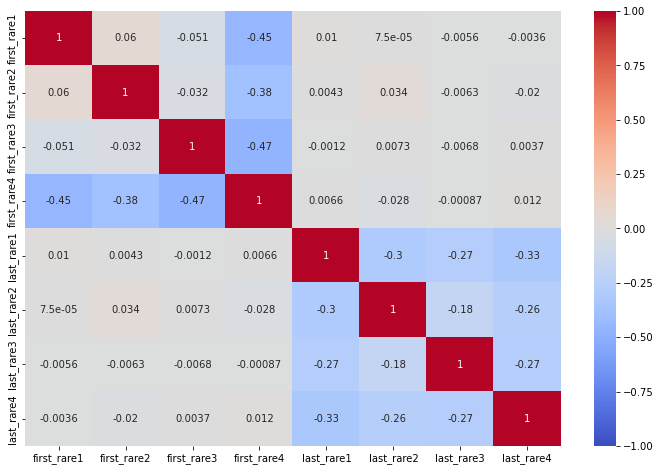

In [14]:
sns.heatmap(corr, annot=True, vmin = -1, vmax = 1, cmap='coolwarm')

The above plot shows correlations of mutational burden in four rare bins within first and last one third of the variants. It shows that the mutational burden in rare 4 is negatively correlated with that in the other bins within the same set of SNPs. Between the sets of SNPs (first and last one thrid) there is no correlation. 

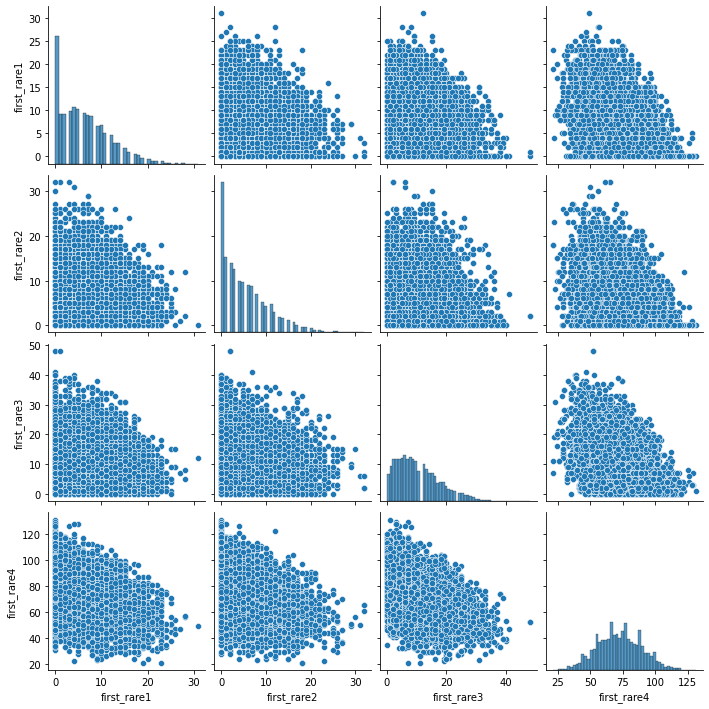

In [85]:
sns.pairplot(burden.iloc[:,0:4])

No abnormal behavior is seen in the scatter plot. The density plot shows, with increase of LD the mutational load goes from right skewed distribution to normality. We will now look at the correlations when the regions overlap. For that we took a set of variants from first two third and another set from last two third of the chromosome. In both sets the SNPs are binned by their LD score. 

In [86]:
first_twothird = np.concatenate([np.repeat(True, 2 * onethird), np.repeat(False, score.shape[0] - 2 * onethird)])
last_twothird = np.concatenate([np.repeat(False, score.shape[0] - 2* onethird), np.repeat(True, 2 * onethird)])
burden = pd.DataFrame({'first_rare1': geno[rare1 & first_twothird].sum(axis = 0), 
            'first_rare2': geno[rare2 & first_twothird].sum(axis = 0),
            'first_rare3': geno[rare3 & first_twothird].sum(axis = 0),
            'first_rare4': geno[rare4 & first_twothird].sum(axis = 0),
            'last_rare1': geno[rare1 & last_twothird].sum(axis = 0),
            'last_rare2': geno[rare2 & last_twothird].sum(axis = 0),
            'last_rare3': geno[rare3 & last_twothird].sum(axis = 0),
            'last_rare4': geno[rare4 & last_twothird].sum(axis = 0)
            })
corr = burden.corr()

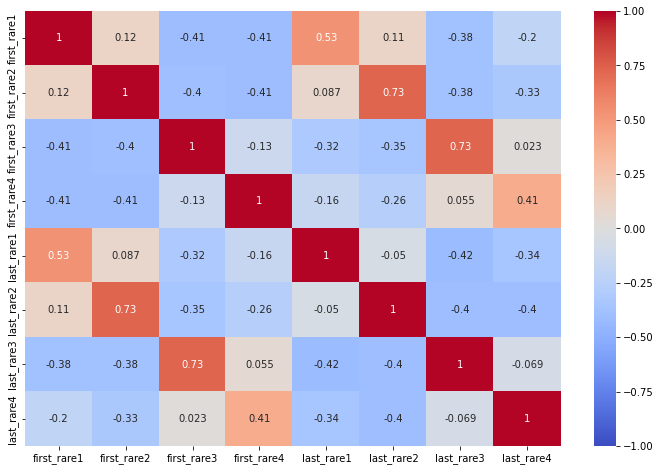

In [87]:
sns.heatmap(corr, annot=True, cmap='coolwarm',vmin = -1, vmax = 1)

# Looking at the real data

I took a shuffled TOPMed sample and look into the correlation of mutational burden. In this analysis, five 5mb region from chromosome 21 is chosen and mutational burden is calculated on Rare 1 - 4 bins. 

In [137]:
real = pd.read_csv('./data/real.data.five.samples.burden', sep = '\t')
corr = real.corr()

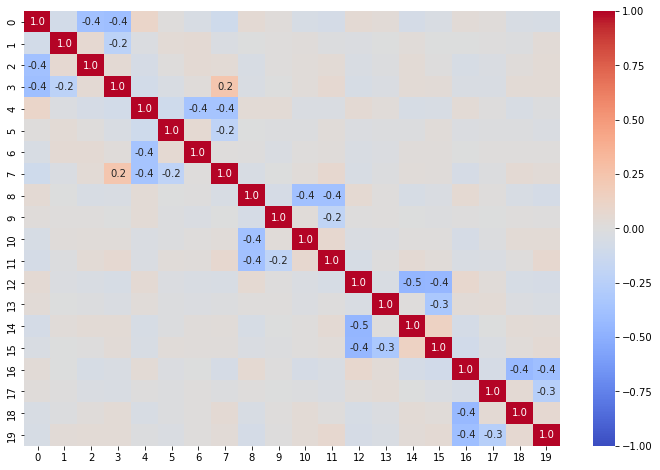

In [170]:
ax = sns.heatmap(np.array(corr), vmin=-1,vmax=1, cmap='coolwarm', annot=True, fmt='.1f')
for t in ax.texts:
    if abs(float(t.get_text()))>=0.2:
        t.set_text(t.get_text()) #if the value is greater than 0.4 then I set the text 
    else:
        t.set_text("")

We see that there are negative correlations within a given region but no (or negligible) correlation between regions. The negative correlation means that if a person is a carrier of high LD rare variatns he is likely to have less number of low LD rare variants. 